In [5]:
import torch.nn.functional as F
import torch.nn as nn
import torch
import matplotlib.pyplot as plt

In [6]:
names = open('names.txt', 'r').read().splitlines()

In [5]:
names[0]

'emma'

In [6]:
names[0]

'emma'

In [7]:
list("hi")

['h', 'i']

In [7]:
chars = sorted(list(set([char for name in names for char in name] + ['<s>', '<e>'])))

In [9]:
bigram_counts = {}


for name in names:
    name_with_start_stop = ["<s>"] + list(name) + ["<e>"]
    for char1, char2 in zip(name_with_start_stop, name_with_start_stop[1:]):
        bigram = (char1, char2)
        bigram_counts[bigram] = bigram_counts.get(bigram, 0) + 1


sorted_bigram_counts = sorted(bigram_counts.items(), key=lambda x: x[1], reverse=True)

def get_bigram(word):
    bigrams = []
    name_with_start_stop = ["<s>"] + list(word) + ["<e>"]
    for char1, char2 in zip(name_with_start_stop, name_with_start_stop[1:]):
        bigram = (char1, char2)
        bigrams.append(bigram)
    return bigrams


In [25]:
import torch
import matplotlib.pyplot as plt

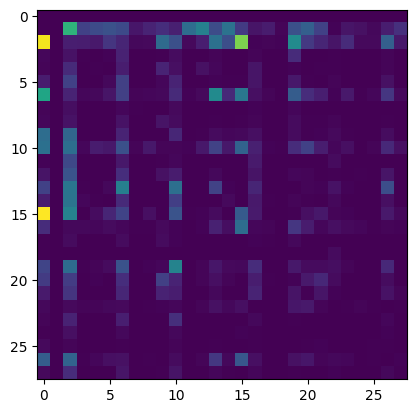

In [11]:
counts = torch.Tensor([[bigram_counts.get((char, char2),0) for char2 in chars] for char in chars ]).int()
plt.imshow(counts)

In [12]:
P = counts / counts.sum(dim=1, keepdim=True)

In [13]:
def get_P():
    counts = torch.Tensor([[bigram_counts.get((char, char2),0) for char2 in chars] for char in chars ]).int() + 1
    P = counts / counts.sum(dim=1, keepdim=True)
    return P


In [10]:
tokeniser = dict(list(map(lambda x: (x[1], x[0]), enumerate(chars))))
detokeniser = dict(enumerate(chars))

def gen_next_token(string, tokeniser, detokeniser, N):

    string = ["<s>"] + list(string)

    tokenised = [tokeniser[char] for char in string]

    last_token = tokenised[-1]

    next_bigram_prob = P[last_token]

    next_token = torch.multinomial(next_bigram_prob, num_samples=1).item()
    output_string = string + [detokeniser[next_token]]
    return "".join(output_string[1:])

def generate_word(initial_string: str = "", verbose=False):
    while "<e>" not in initial_string:
        initial_string = gen_next_token(initial_string, tokeniser, detokeniser, counts)
        
        if verbose:
            print(initial_string)
            
    return initial_string.replace("<e>", "")


In [15]:
def get_negative_log_likelihood(string, P=P):

    bigrams = get_bigram(string)

    probs = []
    for bigram in bigrams:
        prob = P[tokeniser[bigram[0]], tokeniser[bigram[1]]]
        probs.append(prob)

    probs = torch.Tensor(probs)

    return -torch.log(probs).sum()
    

In [16]:
get_negative_log_likelihood("acacac", get_P())

tensor(21.3524)

In [17]:
import torch.nn.functional as F
import torch.nn as nn

In [18]:
F.one_hot(torch.tensor(1), 28)


tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0])

### manual

In [111]:
def get_next_token(xs, ys, W, inference=False):
    x = F.one_hot(torch.tensor(tokeniser[xs]), 28).unsqueeze(0).float() # 28, 1

    logits = x @ W # log counts
    # network gives us log count, to get counts, exp to cancel out the log

    p = (torch.exp(logits) / torch.exp(logits).sum()).squeeze()

    if not inference:
        loss = -torch.log(p[tokeniser[ys]])

    sample = torch.multinomial(p, 1)
    sample = detokeniser[sample.item()]

    if inference:
        return sample

    return loss, sample


In [106]:
W = torch.randn(28,28, requires_grad=True).float() # 28 x 28

3.418266773223877
4.044579029083252
3.70874285697937
3.8590686321258545
3.6659088134765625
3.2594456672668457
4.002904415130615
4.0749735832214355
3.3186185359954834
4.017751216888428
3.7535505294799805
4.177689552307129
3.9578208923339844
3.932133436203003
4.201204776763916
4.145361423492432
3.2560977935791016
3.479569911956787
3.7715461254119873
3.253060817718506
4.213793754577637
3.857553720474243
3.585798978805542
4.081399440765381
3.5001413822174072
3.579619884490967
3.5991432666778564
3.8954594135284424
4.2953386306762695
3.738919496536255
4.265923976898193
3.7572102546691895
3.555180072784424
4.424217224121094
4.003140926361084
3.7954442501068115
4.16162633895874
4.108710765838623
3.4096486568450928
4.019930362701416
3.3446953296661377
3.87884259223938
3.9171054363250732
3.705456018447876
3.632166862487793
3.5582237243652344
3.714982748031616
4.313272953033447
3.383985996246338
3.813462972640991
4.623684883117676
3.6923813819885254
3.9375991821289062
3.3555805683135986
3.5656335

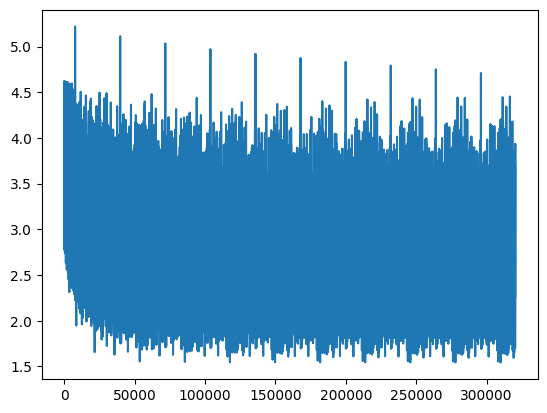

In [ ]:
# TRAINING

loss_log = []

for i in range(10):
    for name in names:
        bigrams = get_bigram(name)

        total_loss = 0
        for xs, ys in bigrams:
            loss, sample = get_next_token(xs, ys, W)

            # L2 regularisation
            # loss += 0.01 * (W**2).mean()

            total_loss += loss
            # print(xs, ys, loss, sample)

        total_loss /= len(bigrams)

        W.grad = None
        total_loss.backward()
        W.data -= W.grad * 1e-2

        print(total_loss.item()) 
        loss_log.append(total_loss.item())

plt.plot(loss_log)

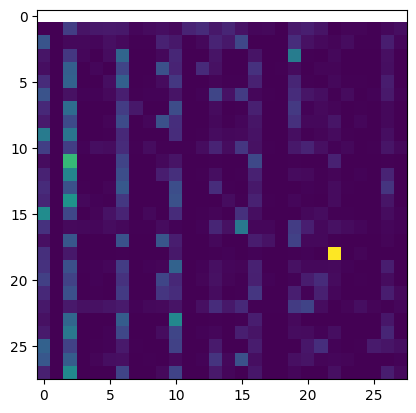

In [108]:
plt.imshow(P)

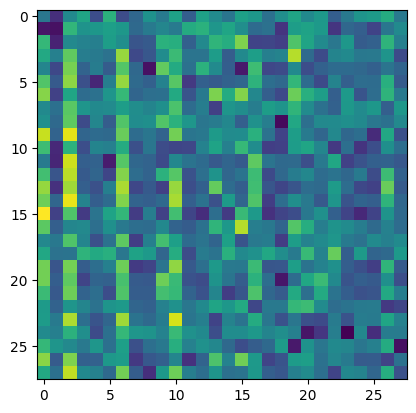

In [ ]:
plt.imshow(W.data)

In [113]:
# INFERENCE

with torch.no_grad():
    for i in range(100):
        string = ['<s>']
        while string[-1] != '<e>':
            next_token = get_next_token(xs=string[-1], ys=None, W=W, inference=True)
            string.append(next_token)
        
        print("".join(string[1:-1]))

tai
mar
aminn
ki
usse
nairalo
aeyachah
n
jxliylaco
ryerahy
jarokarom
idom
l
ahesarun
a
lyicen
jan
l
tylen
midian
emineselar
me
an
jon
risvilo
hon
ay
k
sh
aaro
ogharilgerrlyarmenan
aiyajfrant
brnlipkeo
o
besce
tin
karien
jasamk
loni
mo
shan
ancamaiaz
k
r
ssatlal
cerylaaha
ten
kmeanexyllonebelielie
mmanstvacaden
dadaun
hthadickiyllelton
dha
tablanaylaney
anieurobr
amifak
kly
mrelisfyyn
k
s
ban
phel
anaus
a
jon
tamahyilya
onari
jorobohalellin
h
suethaujowan
<s>ai
ev
mickan
pur
shakashan
tenzavyam
ynqnzare
fiemarjan
xcaran
nt
cwyasane
dan
ubararo
tn
yt
josthessediohgiayji
l
pjqwk
y
ly
liyoriah
jarysl
ky
eo
deija<s>choalmaiatshiderisearin
iagh
ke
sahadan
jocon
kemin
nest


### pytorch

In [20]:
class MLP(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc = nn.Linear(28, 28)

    def forward(self, x):
        x = self.fc(x)
        return x
    
def get_train_example(word):
    bigrams = get_bigram(word)
    xs = list(map(lambda x: x[0], bigrams))
    yx = list(map(lambda x: x[1], bigrams))

    return xs, yx

In [21]:
detokeniser[int(F.one_hot(torch.tensor(tokeniser['k']), 28).argmax())]

'k'

In [22]:
F.one_hot(torch.tensor(tokeniser['a']), 28).long().dtype

torch.int64

In [23]:
train_names = names[:int(len(names) * 0.7)]

losses = []

model = MLP()
optimiser = torch.optim.Adam(model.parameters())

model.train()

for name in train_names:
    xs, yx = get_train_example(name)
    optimiser.zero_grad()

    for i in range(len(xs)):
        logits = model.forward(F.one_hot(torch.tensor(tokeniser[xs[i]]), 28).float())
        yx_indx = int(tokeniser[yx[i]])
        likelihood = logits[yx_indx]
        loss = -torch.log(likelihood)

        print(loss.item())
        losses.append(loss.item())

        loss.backward()
        optimiser.step()


2.934638261795044
nan
2.813538074493408
1.554736852645874
4.623264312744141
1.6520220041275024
2.069775104522705
1.651174545288086
4.446042537689209
1.6497220993041992
2.728296995162964
4.191264629364014
nan
nan
nan
4.0019989013671875
2.0165905952453613
nan
2.4827075004577637
2.390498638153076
nan
2.43463397026062
1.7024222612380981
2.1677751541137695
3.71543550491333
nan
4.34677791595459
nan
1.4103915691375732
1.9228837490081787
2.6520915031433105
3.569899082183838
nan
nan
2.3399436473846436
nan
1.0488829612731934
2.77085542678833
4.808707237243652
2.4434781074523926
1.46860933303833
nan
nan
1.8366742134094238
2.5417301654815674
3.4010775089263916
nan
6.02619743347168
nan
2.184969425201416
1.4608557224273682
2.482579469680786
3.334441900253296
4.280694961547852
2.1380093097686768
nan
nan
3.804044485092163
nan
3.4981958866119385
2.641570568084717
nan
4.06960391998291
2.071024179458618
1.4870814085006714
nan
2.3248045444488525
nan
2.104553461074829
nan
nan
1.5074679851531982
nan
1.15958

KeyboardInterrupt: 

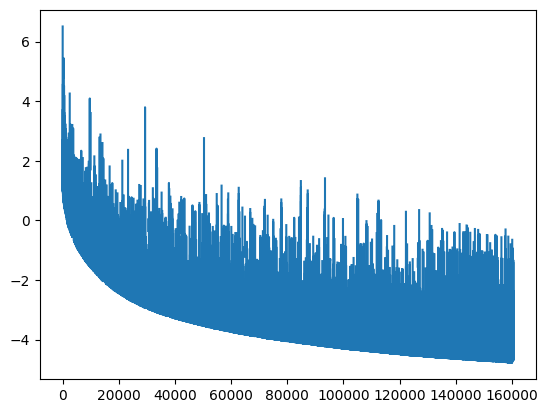

In [ ]:
plt.plot(losses)

In [ ]:
names[int(len(names) * 0.7):]

['irfan',
 'jaasiel',
 'jacolby',
 'jakaiden',
 'jassiah',
 'jaysean',
 'jerson',
 'jhon',
 'jiyan',
 'joelle',
 'joriel',
 'juandiego',
 'jusiah',
 'kashius',
 'khang',
 'kristoff',
 'kyion',
 'lamir',
 'legion',
 'leone',
 'liangelo',
 'lliam',
 'maksym',
 'marquell',
 'martell',
 'mattox',
 'matvey',
 'miklo',
 'miliano',
 'mourad',
 'mousa',
 'nana',
 'nevan',
 'nihit',
 'octavious',
 'ousmane',
 'owyn',
 'quintus',
 'ramesses',
 'raylin',
 'remmington',
 'remus',
 'robby',
 'romell',
 'sajid',
 'shaul',
 'silvestre',
 'stefon',
 'suhayb',
 'suraj',
 'torben',
 'trayson',
 'vian',
 'yuvin',
 'zakhi',
 'zayveon',
 'zeb',
 'aakash',
 'abdimalik',
 'adael',
 'adair',
 'adian',
 'adrik',
 'advay',
 'alexey',
 'alexi',
 'almir',
 'amer',
 'amr',
 'aneesh',
 'arjunreddy',
 'artis',
 'avyukth',
 'ayomide',
 'brando',
 'braylyn',
 'bright',
 'broc',
 'bryceson',
 'burton',
 'canton',
 'carey',
 'cary',
 'cashel',
 'cashius',
 'chesky',
 'christen',
 'cyrie',
 'damier',
 'darron',
 'dasan',

In [ ]:
test_names = names[int(len(names) * 0.7):]


model.eval()
test_losses = []
with torch.no_grad():
    for name in test_names:
        xs, yx = get_train_example(name)
        for i in range(len(xs)):
            logits = model.forward(F.one_hot(torch.tensor(tokeniser[xs[i]]), 28).float())
            yx_indx = int(tokeniser[yx[i]])
            likelihood = logits[yx_indx]
            loss = -torch.log(likelihood)

            print(loss.item())
            test_losses.append(loss.item())



-4.568511486053467
nan
-2.8968148231506348
nan
-3.629404067993164
-4.39092493057251
nan
nan
nan
nan
-4.568480968475342
nan
nan
-4.200306415557861
nan
nan
nan
nan
-2.6607022285461426
nan
nan
-4.28040885925293
nan
nan
-4.1244215965271
nan
-4.676785945892334
-4.03325080871582
nan
nan
-4.39092493057251
nan
nan
nan
nan
-4.568480968475342
nan
-2.902650833129883
-4.3035736083984375
nan
nan
nan
-2.449633836746216
nan
nan
-3.629404067993164
-4.39092493057251
nan
nan
nan
nan
nan
nan
-4.39092493057251
nan
nan
nan
nan
-4.39092493057251
nan
-4.446065902709961
nan
nan
-3.629404067993164
-4.39092493057251
nan
nan
nan
nan
nan
nan
-4.3674821853637695
nan
nan
nan
-4.7699761390686035
nan
nan
-4.200306415557861
nan
nan
nan
-3.629404067993164
-4.092309951782227
-4.565929889678955
nan
-3.5253918170928955
nan
-4.140401363372803
nan
nan
nan
-4.568480968475342
nan
-2.902650833129883
-4.3035736083984375
-4.447160720825195
nan
nan
nan
-4.566413402557373
nan
nan
-4.185674667358398
-4.447160720825195
nan
nan
-3.62

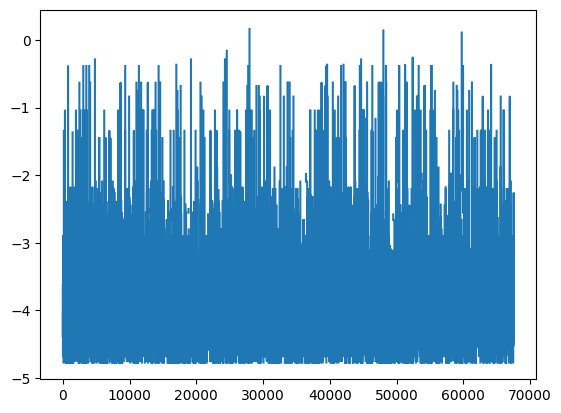

In [ ]:
plt.plot(test_losses)

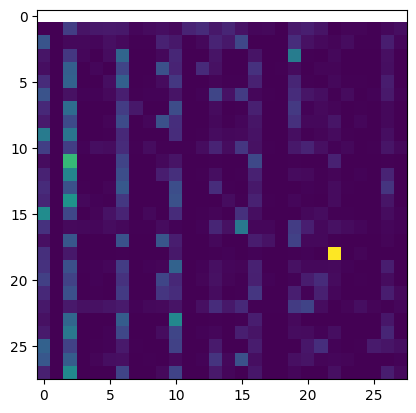

In [ ]:
plt.imshow(P)

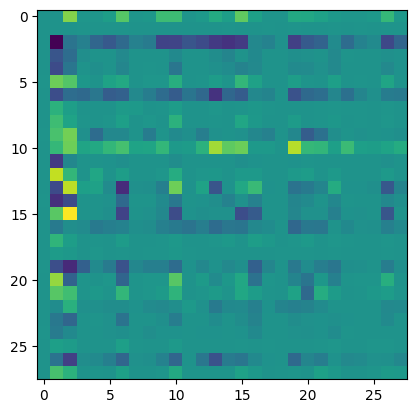

In [ ]:
plt.imshow(list(model.parameters())[0].detach().clone())

In [ ]:
with torch.no_grad():
    tokens = ['<s>', 'k']
    next_token = tokens[0]
    while next_token != "<e>":
        logits = model.forward(F.one_hot(torch.tensor(tokeniser[next_token]), 28).float())
        print(logits.argmax())
        next_token = detokeniser[int(logits.argmax())]
        tokens.append(next_token)
        print(next_token)
    print(tokens[1:-1])
    

tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i
tensor(10)
i

KeyboardInterrupt: 

In [ ]:
tokens

['<s>']

### MLP

In [3]:
names

['emma',
 'olivia',
 'ava',
 'isabella',
 'sophia',
 'charlotte',
 'mia',
 'amelia',
 'harper',
 'evelyn',
 'abigail',
 'emily',
 'elizabeth',
 'mila',
 'ella',
 'avery',
 'sofia',
 'camila',
 'aria',
 'scarlett',
 'victoria',
 'madison',
 'luna',
 'grace',
 'chloe',
 'penelope',
 'layla',
 'riley',
 'zoey',
 'nora',
 'lily',
 'eleanor',
 'hannah',
 'lillian',
 'addison',
 'aubrey',
 'ellie',
 'stella',
 'natalie',
 'zoe',
 'leah',
 'hazel',
 'violet',
 'aurora',
 'savannah',
 'audrey',
 'brooklyn',
 'bella',
 'claire',
 'skylar',
 'lucy',
 'paisley',
 'everly',
 'anna',
 'caroline',
 'nova',
 'genesis',
 'emilia',
 'kennedy',
 'samantha',
 'maya',
 'willow',
 'kinsley',
 'naomi',
 'aaliyah',
 'elena',
 'sarah',
 'ariana',
 'allison',
 'gabriella',
 'alice',
 'madelyn',
 'cora',
 'ruby',
 'eva',
 'serenity',
 'autumn',
 'adeline',
 'hailey',
 'gianna',
 'valentina',
 'isla',
 'eliana',
 'quinn',
 'nevaeh',
 'ivy',
 'sadie',
 'piper',
 'lydia',
 'alexa',
 'josephine',
 'emery',
 'julia'

In [26]:
context_length = 3
xs = []
ys = []
for name in names[:5]:
    name = ['<s>'] + list(name) + ['<e>']
    length = len(name)
    last_start_idx = length - context_length - 1

    for idx, char in enumerate(name[:last_start_idx + 1]):
        x = list(map(lambda x: tokeniser[x],name[idx:idx+context_length]))
        y = tokeniser[name[idx+context_length]]
        xs += [x]
        ys += [y]

xs = torch.tensor(xs)
ys = torch.tensor(ys)

print(xs, ys)

tensor([[ 1,  6, 14],
        [ 6, 14, 14],
        [14, 14,  2],
        [ 1, 16, 13],
        [16, 13, 10],
        [13, 10, 23],
        [10, 23, 10],
        [23, 10,  2],
        [ 1,  2, 23],
        [ 2, 23,  2],
        [ 1, 10, 20],
        [10, 20,  2],
        [20,  2,  3],
        [ 2,  3,  6],
        [ 3,  6, 13],
        [ 6, 13, 13],
        [13, 13,  2],
        [ 1, 20, 16],
        [20, 16, 17],
        [16, 17,  9],
        [17,  9, 10],
        [ 9, 10,  2]]) tensor([14,  2,  0, 10, 23, 10,  2,  0,  2,  0,  2,  3,  6, 13, 13,  2,  0, 17,
         9, 10,  2,  0])


In [87]:
C[xs.int()].shape

torch.Size([228146, 3, 2])

In [13]:
context_length = 3
X = []
Y = []
for name in names:
    name = list(name) + ['<e>']

    context = [tokeniser['<s>']] * context_length

    for char in name:
        X += [context]
        Y += [tokeniser[char]]

        context = context[1:] + [tokeniser[char]]

X = torch.tensor(X).float()
Y = torch.tensor(Y)

print(X, Y)

X.shape, X.dtype, Y.shape, Y.dtype

tensor([[ 1.,  1.,  1.],
        [ 1.,  1.,  6.],
        [ 1.,  6., 14.],
        ...,
        [27., 27., 26.],
        [27., 26., 27.],
        [26., 27., 25.]]) tensor([ 6, 14, 14,  ..., 27, 25,  0])


(torch.Size([228146, 3]), torch.float32, torch.Size([228146]), torch.int64)

In [153]:
lr_exp = torch.linspace(-3, 0, 1000)
lr = 10**lr_exp
lr

tensor([0.0010, 0.0010, 0.0010, 0.0010, 0.0010, 0.0010, 0.0010, 0.0010, 0.0011,
        0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011, 0.0011,
        0.0011, 0.0011, 0.0011, 0.0012, 0.0012, 0.0012, 0.0012, 0.0012, 0.0012,
        0.0012, 0.0012, 0.0012, 0.0012, 0.0012, 0.0012, 0.0013, 0.0013, 0.0013,
        0.0013, 0.0013, 0.0013, 0.0013, 0.0013, 0.0013, 0.0013, 0.0013, 0.0014,
        0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014, 0.0014,
        0.0015, 0.0015, 0.0015, 0.0015, 0.0015, 0.0015, 0.0015, 0.0015, 0.0015,
        0.0015, 0.0016, 0.0016, 0.0016, 0.0016, 0.0016, 0.0016, 0.0016, 0.0016,
        0.0016, 0.0017, 0.0017, 0.0017, 0.0017, 0.0017, 0.0017, 0.0017, 0.0017,
        0.0018, 0.0018, 0.0018, 0.0018, 0.0018, 0.0018, 0.0018, 0.0018, 0.0019,
        0.0019, 0.0019, 0.0019, 0.0019, 0.0019, 0.0019, 0.0019, 0.0020, 0.0020,
        0.0020, 0.0020, 0.0020, 0.0020, 0.0020, 0.0021, 0.0021, 0.0021, 0.0021,
        0.0021, 0.0021, 0.0021, 0.0022, 

In [101]:
# train, val/dev, test split
data_length = X.shape[0]
n_1 = int(data_length * 0.8)
n_2 = int(data_length * 0.9)

Xtr, Xval, Xtst = X[0:n_1], X[n_1: n_2], X[n_2: ]
Ytr, Yval, Ytst = Y[0:n_1], Y[n_1: n_2], Y[n_2: ]

In [102]:
embedding_dims = 8
num_hidden = 250
batch_size = 32

C = torch.randn(len(chars), embedding_dims)
W_1 = torch.randn(embedding_dims * context_length, num_hidden) * 0.2 # make tanh result be evenly distributed 
# (not at extremes, so when you differentiate, you don't get 0 gradient, dead and not learning neurons)

b_1 = torch.randn(num_hidden) * 0.01
W_2 = torch.randn(num_hidden, len(chars)) * 0.01 # ensure logits are close to 0 at initialisation
b_2 = torch.randn(len(chars)) * 0 # ensure logits are close to 0 at initialisation, prevent huge initial loss

parameters = [C, W_1, b_1, W_2, b_2]

for p in parameters:
    p.requires_grad = True

# lr = 1e-2
losses = []



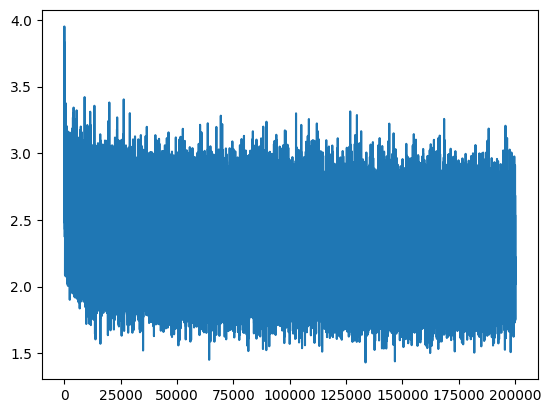

In [103]:
# TRAIN



epochs = 200000

X_used = Xtr
Y_used = Ytr


for e in range(epochs):
    batch_ix = torch.randint(0, X_used.shape[0], (32,))

    W_1.grad = None
    W_2.grad = None
    C.grad = None


    # logits = F.one_hot(X[i].long(), len(chars)).flatten().float() @ W_1 @ W_2
    logits = torch.tanh(C[X_used.int()[batch_ix]].view(-1, context_length * embedding_dims) @ W_1 + b_1) @ (W_2 + b_2)

    # counts = logits.exp()
    # p = counts / counts.sum(1, keepdim=True)
    # loss = (-p[torch.arange(len(Y)),Y].log()).mean()

    loss = F.cross_entropy(logits, Y_used[batch_ix])

    loss.backward()
    losses.append(loss.item())
    # print(loss.item())

    for p in parameters:
        # p.data -= p.grad * (0.1 if e < 2000 else 0.01)
        p.data -= p.grad * 0.01
    
    # W_1.data -= W_1.grad * lr
    # W_2.data -= W_2.grad * lr
    # b_1.data -= b_1.grad * lr
    # b_2.data -= b_2.grad * lr
    # C.data -= C.grad * lr


plt.plot(losses)

In [99]:
# Check training loss

logits = torch.tanh(C[Xtr.int()].view(-1, context_length * embedding_dims) @ W_1 + b_1) @ (W_2 + b_2)
loss = F.cross_entropy(logits, Ytr)

print(loss)


tensor(2.2444, grad_fn=<NllLossBackward0>)


In [100]:
# Validation

logits = torch.tanh(C[Xval.int()].view(-1, context_length * embedding_dims) @ W_1 + b_1) @ (W_2 + b_2)
loss = F.cross_entropy(logits, Yval)

print(loss)


tensor(2.4924, grad_fn=<NllLossBackward0>)


In [78]:
# Test

logits = torch.tanh(C[Xtst.int()].view(-1, context_length * embedding_dims) @ W_1 + b_1) @ (W_2 + b_2)
loss = F.cross_entropy(logits, Ytst)

print(loss)


tensor(2.5434, grad_fn=<NllLossBackward0>)


In [19]:
min(losses)

2.268049478530884

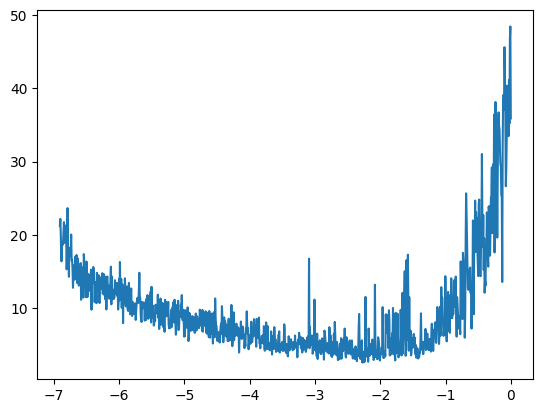

In [157]:
plt.plot(torch.log(lr), losses)

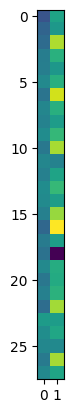

In [98]:
plt.imshow(C.detach().numpy())

In [91]:
# Sample from the model

for i in range(100):
    context = [1] * context_length
    name = ""
    while True:
        logits = torch.tanh(C[context].view(-1, context_length * embedding_dims) @ W_1 + b_1) @ (W_2 + b_2)
        p = F.softmax(logits)
        sample = torch.multinomial(p, 1).item()

        context = context[1:] + [sample]

        if sample == 0:
            break
        name += detokeniser[sample]

    print(name)

brdifalallia
ramde
alal
amalle
brellyn
zelanaltigrirella
halynnoa
zimalyanayleigh
shandonal
woral
jcu
sirahza
syrenilie
grisrasree
demauana
zelerarara
kadzysal
torerde
neg
iulanais
soranda
adaeianaseltanni
cavalla
darar
wachlee
jakilf
calamerala
larar
rora
ema
taelanistlecour
aude
aylueah
harnaely
kail
brea
hean
natho
nan
darfe
ead
alila
dyruekhiastin
keria
ablynn
khandankandha
sayennan
daerandygsamora
cala
yawa
aosyn
seannizia
aud
sajalin
mira
zoca
reriyah
msiya
lakalliah
catmicelyna
sy
adaraleig
ska
avi
aria
doy
jacuotlua
rarrando
nakella
zaivide
olira
bresandhera
cayla
mimabaz
ummiazdofe
catill
lay
alayrien
lorei
breonc
kyvaritso
zitela
tarlla
madlyn
waimertytiniah
hyleta
jemalesiannaleidi
racla
grie
dessan
mimi
sama
maretentvy
kyya
daranarie
madistangulinavreigon
razmis
keligi
razalehdida
naria


/var/folders/v5/z7rgl2ms317g49cj9p8qglrh0000gn/T/ipykernel_31910/3932834142.py:8: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  p = F.softmax(logits)


In [84]:
tokeniser

{'<e>': 0,
 '<s>': 1,
 'a': 2,
 'b': 3,
 'c': 4,
 'd': 5,
 'e': 6,
 'f': 7,
 'g': 8,
 'h': 9,
 'i': 10,
 'j': 11,
 'k': 12,
 'l': 13,
 'm': 14,
 'n': 15,
 'o': 16,
 'p': 17,
 'q': 18,
 'r': 19,
 's': 20,
 't': 21,
 'u': 22,
 'v': 23,
 'w': 24,
 'x': 25,
 'y': 26,
 'z': 27}

In [82]:
detokeniser[sample.item()]

'x'